# PyVista

API de alto nivel para VTK, instalar  con:

    !pip install pyvista
    
VTK is a powerful scientific visualization software library, and with Python bindings, itcombines the speed of C++ with the rapid prototyping of Python. Despite this, VTKcode programmed in Python using the base VTK Python package is unnecessarily com-plicated as its API binds existing C++ calls. The PyVista Python package provides aconcise, well-documented interface exposing VTK’s powerful visualization backend; en-abling researchers to rapidly explore large datasets, communicate their spatial findings,and facilitate reproducibility. PyVista further seeks to simplify standard mesh creationand plotting routines without compromising on the speed of the C++ VTK backend  [(read full paper)](https://www.theoj.org/joss-papers/joss.01450/10.21105.joss.01450.pdf)

In [2]:
!pip install pyvista --user

## Input-output
### Leer archivo VTK 

Al llamar al objeto creado en la lectura del archivo se muestra un resumen de los elementos y propiedades de la malla

In [6]:
import pyvista as pv
mesh = pv.read('tubes.vtk')
mesh

PolyData (0x7fbedf900910)
  N Cells:	52112
  N Points:	26436
  X Bounds:	-5.000e-01, 5.000e-01
  Y Bounds:	-5.000e-01, 5.000e-01
  Z Bounds:	-5.000e-01, 5.000e-01
  N Arrays:	3

### Acceder a propiedades  y elementos de la malla

In [3]:
mesh.n_cells, mesh.n_points, mesh.n_arrays, mesh.bounds,mesh.center,mesh.points

(52112,
 26436,
 3,
 [-0.5, 0.5, -0.5, 0.5, -0.5, 0.5],
 [0.0, 0.0, 0.0],
 pyvista_ndarray([[-4.65494310e-01, -1.49956764e-01, -1.50894401e-02],
                  [-4.65494310e-01, -1.49956764e-01,  1.50894401e-02],
                  [-4.57562201e-01, -1.50729787e-01,  1.26761543e-18],
                  ...,
                  [ 1.50912398e-01, -3.70469137e-03,  4.93576867e-01],
                  [ 1.50185660e-01, -1.47919962e-02,  5.00000000e-01],
                  [ 1.50912340e-01, -3.21129241e-17,  5.00000000e-01]]))

### Capturar una imagen de la malla

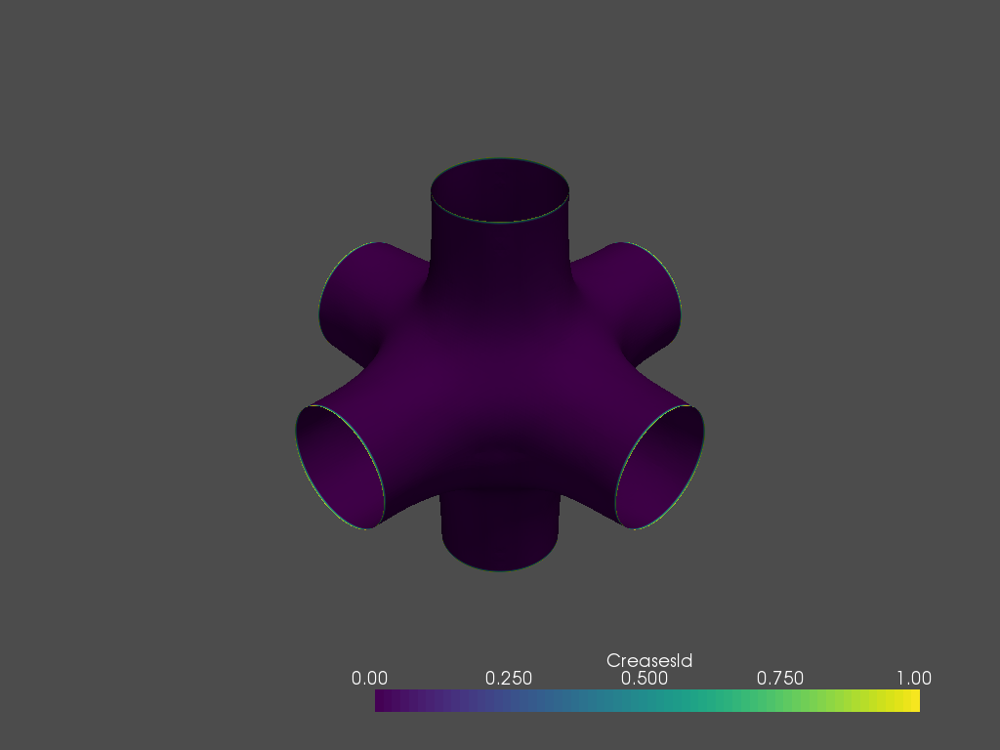

In [4]:
%matplotlib notebook
mesh.plot(screenshot='tube.png')

### Guardar malla como archivo vtk

### Guardar malla convirtiendo a cualquiera de los formatos soportados por MESHIO
[meshio](https://pypi.org/project/meshio/)

Abaqus, ANSYS msh, AVS-UCD, CGNS, DOLFIN XML, Exodus, FLAC3D, H5M, Kratos/MDPA, Medit, MED/Salome, Nastran (bulk data), Neuroglancer precomputed format, Gmsh (format versions 2.2, 4.0, and 4.1), OBJ, OFF, PERMAS, PLY, STL, Tecplot .dat, TetGen .node/.ele, SVG (2D only, output only), UGRID, VTK, VTU (not raw binary data), WKT (TIN), XDMF.

en este ejemplo se convierte de .obj

In [5]:
pv.save_meshio("mesh.obj", mesh)

### Visualización interactiva con itkWidgets

Permite una visualización interactiva dentro de los notebooks de Jupyter

install with:

    !pip install itkwidgets

In [1]:
!pip install itkwidgets --user


In [1]:
import pyvista as pv
from itkwidgets import view
%matplotlib widget

# create a mesh and identify some scalars you wish to plot
mesh = pv.Sphere()
z = mesh.points[:, 2]

# Plot using the ITKplotter
pl = pv.PlotterITK()
pl.add_mesh(mesh, scalars=z, smooth_shading=True)
pl.show(True)


Viewer(geometries=[{'vtkClass': 'vtkPolyData', 'points': {'vtkClass': 'vtkPoints', 'name': '_points', 'numberO…

In [2]:
from itkwidgets import view
import pyvista as pv
mesh = pv.read('tubes.vtk')

%matplotlib notebook
view(geometries={'Tubes':mesh})

Viewer(geometries=[{'vtkClass': 'vtkPolyData', 'points': {'vtkClass': 'vtkPoints', 'name': '_points', 'numberO…

Tambien existen funciones que de pyvista que incorpran el llamado a itkwidget como pyvista.PlotterITK():

In [5]:
pl = pv.PlotterITK()
pl.add_mesh(mesh, smooth_shading=True)
pl.show(True)

Viewer(geometries=[{'vtkClass': 'vtkPolyData', 'points': {'vtkClass': 'vtkPoints', 'name': '_points', 'numberO…

## Filtros 
[lista completa de filtros](https://docs.pyvista.org/core/filters.html)

### Ejemplo buscar secciones de los bordes de una shell

En este caso obtendremos todos los nodos que forman los anillos de los bordes

In [4]:
import pyvista as pv
from itkwidgets import view

mesh = pv.read('tubes.vtk')
bordes=mesh.extract_edges( boundary_edges=True)
bordes

PolyData (0x7fdd02cee670)
  N Cells:	768
  N Points:	768
  X Bounds:	-5.000e-01, 5.000e-01
  Y Bounds:	-5.000e-01, 5.000e-01
  Z Bounds:	-5.000e-01, 5.000e-01
  N Arrays:	3

In [5]:
view(geometries=bordes)

Viewer(geometries=[{'vtkClass': 'vtkPolyData', 'points': {'vtkClass': 'vtkPoints', 'name': '_points', 'numberO…

### Agrupar los nodos de los bordes según su conectividad

En este caso obtendremos 6 listas con cada uno de los anillos

In [6]:
anillos=bordes.split_bodies(label=True)
anillos

MultiBlock (0x7fdd02d0b050)
  N Blocks:	6
  X Bounds:	-0.500, 0.500
  Y Bounds:	-0.500, 0.500
  Z Bounds:	-0.500, 0.500

inspeccionando el primero de los elementos:

In [7]:
anillos[0]

UnstructuredGrid (0x7fdd02d0b4b0)
  N Cells:	128
  N Points:	128
  X Bounds:	-5.000e-01, -5.000e-01
  Y Bounds:	-1.509e-01, 1.509e-01
  Z Bounds:	-1.509e-01, 1.509e-01
  N Arrays:	5

### Obtener el id de cada nodo de uno de los anillos
compara los nodos de uno de los anillos con todos los de la malla 

**método provisorio** el doble loop interpretato tomó ~20 segundos para una malla de 26.436 nodos en una i5 7th Gen

In [ ]:
from timeit import default_timer as timer
import numpy as np

start = timer()

ids_anillo=np.zeros(len(anillos[1].points))             #array vacio 
ids=0
tot=0
for i in mesh.points:                                  #para cada punto de la malla
    for j in anillos[1].points:                        #para cada punto del anillo 1
        if np.array_equal(j, i):                       #si son iguales
            ids_anillo[tot]=ids                        #
            tot+=1
    ids+=1
    
end = timer()
print(end - start)

In [95]:
ids_anillo

array([ 6382.,  6383.,  6384.,  6385.,  6386.,  6387.,  6388.,  6389.,
        6390.,  6391.,  6392.,  6393.,  6394.,  6395.,  6396.,  6397.,
        6398.,  6399.,  6400.,  6401.,  6402.,  6403.,  6404.,  6405.,
        6406.,  6407.,  6408.,  6409.,  6410.,  6411.,  6412.,  6413.,
        6414.,  6415.,  6416.,  6417.,  6418.,  6419.,  6420.,  6421.,
        6422.,  6423.,  6424.,  6425.,  6426.,  6427.,  6428.,  6429.,
        6430.,  6431.,  6432.,  6433.,  6434.,  6435.,  6436.,  6437.,
        6438.,  6439.,  6440.,  6441.,  6442.,  6443.,  6444.,  6445.,
       25480., 25483., 25486., 25489., 25492., 25495., 25498., 25501.,
       25504., 25507., 25510., 25513., 25516., 25519., 25522., 25525.,
       25528., 25531., 25534., 25537., 25540., 25543., 25546., 25549.,
       25552., 25555., 25558., 25561., 25564., 25567., 25570., 25573.,
       25576., 25579., 25582., 25585., 25588., 25591., 25594., 25597.,
       25600., 25603., 25606., 25609., 25612., 25615., 25618., 25621.,
      

In [58]:
mesh.extract_points([26435])

UnstructuredGrid (0x7f1175850a60)
  N Cells:	3
  N Points:	5
  X Bounds:	1.507e-01, 1.509e-01
  Y Bounds:	-7.405e-03, 7.405e-03
  Z Bounds:	4.936e-01, 5.000e-01
  N Arrays:	5

In [52]:
mesh.n_points, len(mesh.points)

(26436, 26436)

In [1]:
import pyvista as pv

mesh = pv.read('tubes.vtk')
plotter = pv.Plotter()
plotter.add_mesh(mesh)
output = plotter.show(auto_close=False, use_panel=True)
#p.show(auto_close=False, use_panel=True)

In [1]:
import pyvista as pv
#%matplotlib widget
sphere = pv.Sphere()

p = pv.Plotter()
p.add_mesh(sphere)
p.show(auto_close=False, use_panel=True)

VTK(vtkXOpenGLRenderWindow, height=400, sizing_mode='stretch_width')

###  Ejemplo Delaunay con valores generados

[ver más](https://docs.pyvista.org/examples/00-load/create-tri-surface.html)

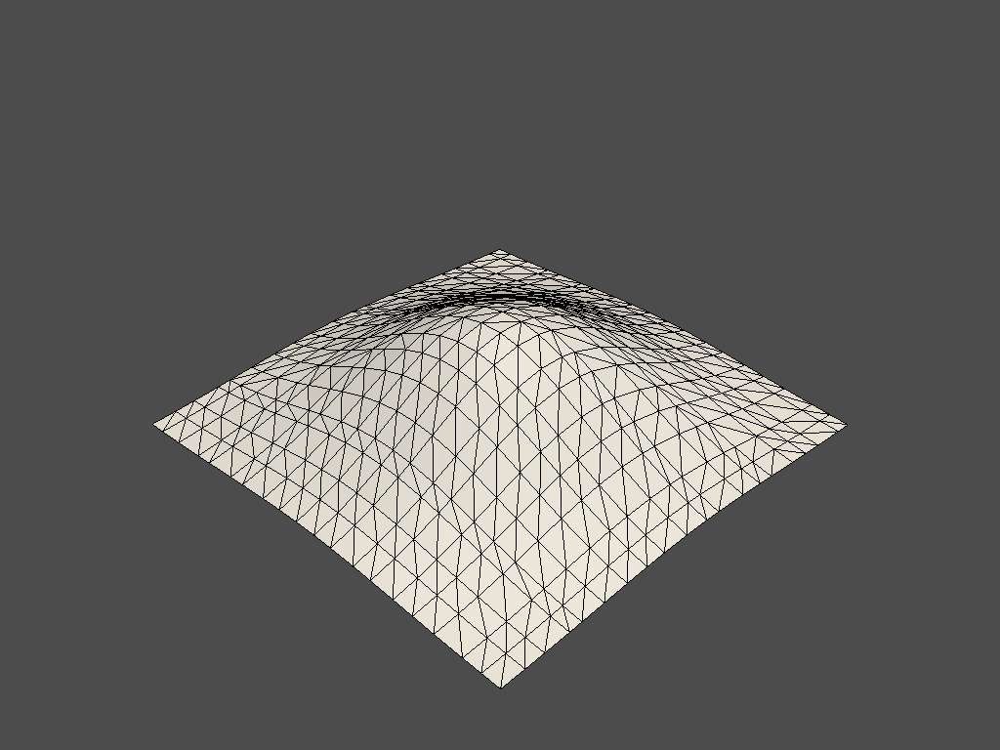

In [2]:
import pyvista as pv
import numpy as np

n = 20
x = np.linspace(-200, 200, num=n) + np.random.uniform(-5, 5, size=n)
y = np.linspace(-200, 200, num=n) + np.random.uniform(-5, 5, size=n)
xx, yy = np.meshgrid(x, y)
A, b = 100, 100
zz = A * np.exp(-0.5 * ((xx / b) ** 2.0 + (yy / b) ** 2.0))

# Get the points as a 2D NumPy array (N by 3)
points = np.c_[xx.reshape(-1), yy.reshape(-1), zz.reshape(-1)]
points[0:5, :]

cloud = pv.PolyData(points)

surf = cloud.delaunay_2d()
surf.plot(show_edges=True)

In [4]:
from pyvista import examples
import pyvista as pv
mesh = examples.download_st_helens().warp_by_scalar()


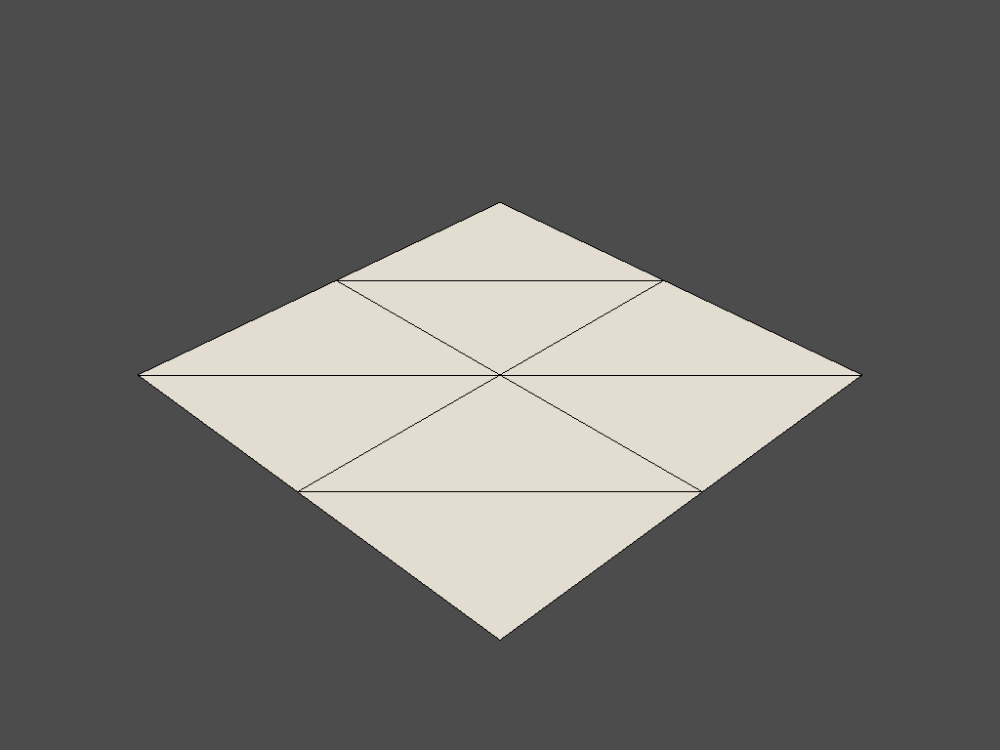

In [25]:
import pyvista as pv
import numpy as np

n = 3
x = np.linspace(-2, 2, num=n) 
y = np.linspace(-2, 2, num=n) 
xx, yy = np.meshgrid(x, y)
A, b = 100, 100
zz = xx*0-1




# Get the points as a 2D NumPy array (N by 3)
points = np.c_[xx.reshape(-1), yy.reshape(-1), zz.reshape(-1)]
points[0:5, :]

cloud = pv.PolyData(points)

surf = cloud.delaunay_2d()
surf.plot(show_edges=True)
surf.save("non_manifold.vtk")

In [20]:
import pyvista as pv
import numpy as np

n = 3
x = np.linspace(-2, 2, num=n) 
y = np.linspace(-2, 2, num=n) 
xx, yy = np.meshgrid(x, y)
A, b = 100, 100
zz = xx*0+1




# Get the points as a 2D NumPy array (N by 3)
points = np.c_[xx.reshape(-1), yy.reshape(-1), zz.reshape(-1)]

points

array([[-2., -2.,  1.],
       [ 0., -2.,  1.],
       [ 2., -2.,  1.],
       [-2.,  0.,  1.],
       [ 0.,  0.,  1.],
       [ 2.,  0.,  1.],
       [-2.,  2.,  1.],
       [ 0.,  2.,  1.],
       [ 2.,  2.,  1.]])

In [28]:
points=np.array([[-2., -4.,  1.],
       [ 0., -4.,  1.],
       [ 2., -4.,  1.],
       [-2.,  -2.,  0.],
       [ 0.,  -2.,  0.],
       [ 2.,  -2.,  0.],
       [-2.,  0.,  -1.],
       [ 0.,  0.,  -1.],
       [ 2.,  0.,  -1]])

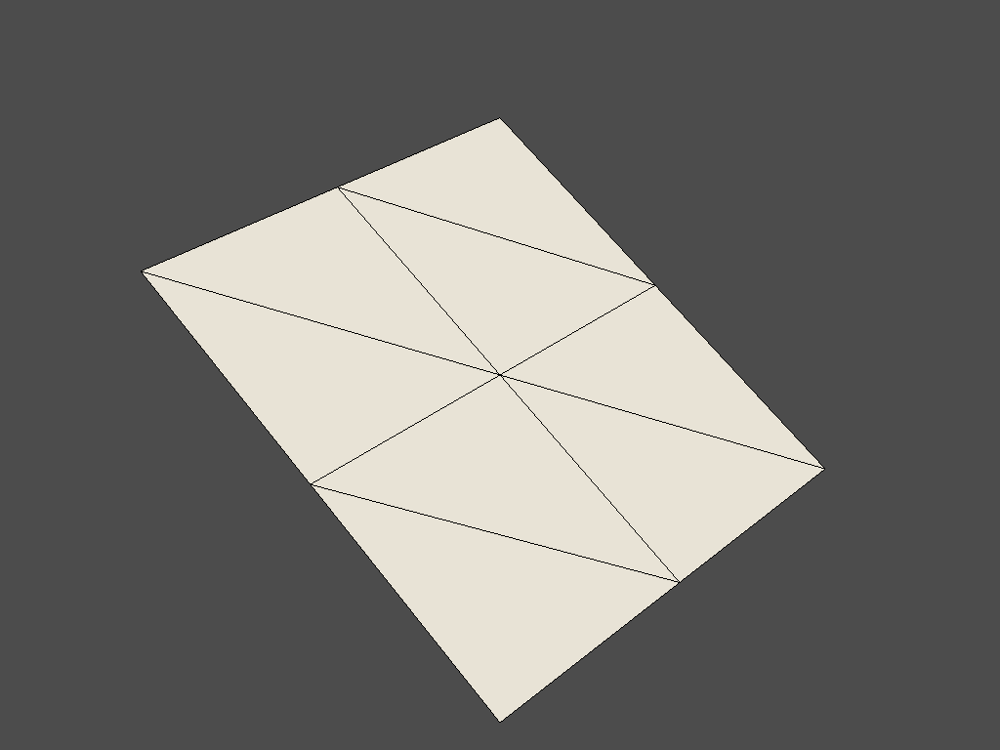

In [29]:
cloud = pv.PolyData(points)
surf = cloud.delaunay_2d()
surf.plot(show_edges=True)
surf.save("non_manifold2.vtk")

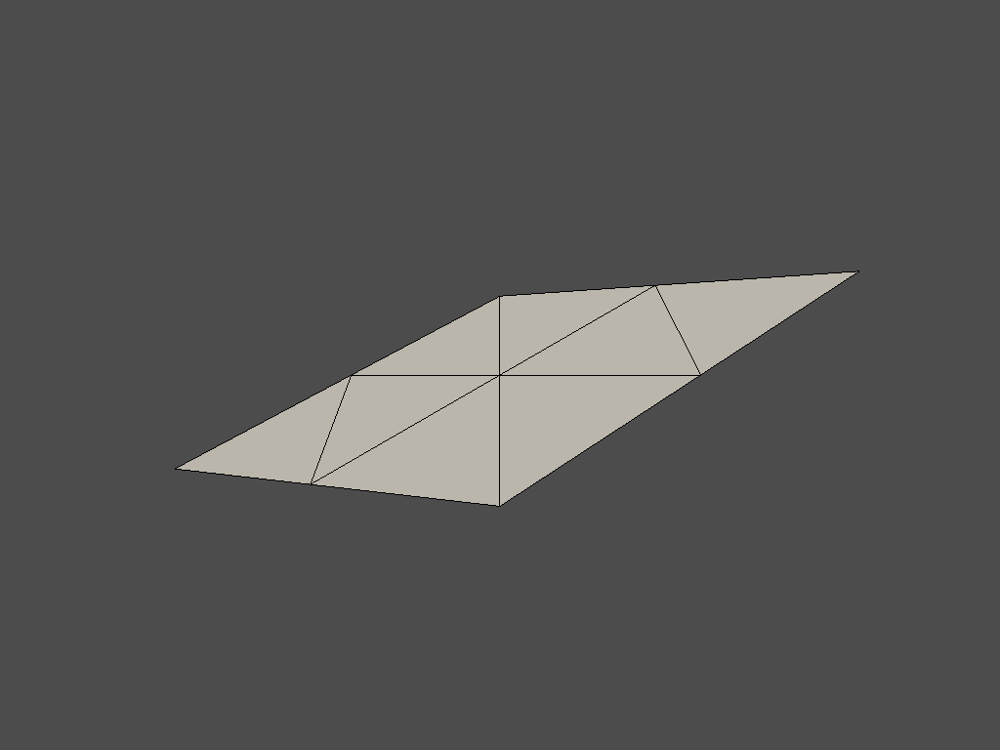

In [32]:
points=np.array([[-2., 4.,  1.],
       [ 0., 4.,  1.],
       [ 2., 4.,  1.],
       [-2.,  2.,  0.],
       [ 0.,  2.,  0.],
       [ 2.,  2.,  0.],
       [-2.,  0.,  -1.],
       [ 0.,  0.,  -1.],
       [ 2.,  0.,  -1]])
cloud = pv.PolyData(points)
surf = cloud.delaunay_2d()
surf.plot(show_edges=True)
surf.save("non_manifold3.vtk")

## Creando una superficie Non Manifold

In [1]:
import pyvista as pv
from itkwidgets import view
import numpy as np
#%matplotlib widget
vertices = np.array([[0, 0, 0],
                     [-1, 0, 0],
                     [1,0,0],
                     [-1,1,0],
                     [0,1,0],
                     [1,1,0],
                     [-1,-1,0],
                     [0,-1,0],
                     [1,-1,0],
                     [-1,0,1],
                     [0,0,1],
                     [1,0,1],                     
                    ])

faces = np.hstack([[3,1,0,3],
                    [3,0,4,3],
                    [3,0,2,4],
                    [3,2,5,4],
                    [3,6,7,1],
                    [3,7,0,1],
                    [3,7,8,0],
                    [3,8,2,0],
                    [3,9,10,1],
                    [3,10,0,1],
                    [3,11,10,0],
                    [3,11,2,0],
                  ])    # triangle


surf = pv.PolyData(vertices, faces)
surf.plot(show_edges=True)
surf.save("non_manifold_T.vtk")

mesh = pv.read('non_manifold_T.vtk')

p = pv.Plotter()
p.add_mesh(mesh)
p.show(auto_close=False, use_panel=True)



ModuleNotFoundError: No module named 'itkwidgets'

In [2]:
import pyvista as pv
print(pv.Report())


--------------------------------------------------------------------------------
  Date: Fri Apr 24 06:30:54 2020 -03

                OS : Linux
            CPU(s) : 4
           Machine : x86_64
      Architecture : 64bit
               RAM : 11.5 GB
       Environment : Jupyter
        GPU Vendor : Intel Open Source Technology Center
      GPU Renderer : Mesa DRI Intel(R) HD Graphics 620 (Kaby Lake GT2)
       GPU Version : 4.5 (Core Profile) Mesa 18.3.6

  Python 3.7.4 (default, Aug 13 2019, 20:35:49)  [GCC 7.3.0]

           pyvista : 0.24.0
               vtk : 8.1.2
             numpy : 1.17.2
           imageio : 2.6.0
           appdirs : 1.4.3
            scooby : 0.5.2
        matplotlib : 3.1.1
             PyQt5 : 5.9.2
           IPython : 7.8.0
          colorcet : 1.0.0
             panel : 0.9.5
             scipy : 1.3.1

  Intel(R) Math Kernel Library Version 2019.0.4 Product Build 20190411 for
  Intel(R) 64 architecture applications
--------------------------------

### Ejemplo aplicando Delaunay a datos de SanRafael obtenidos con geoloc.py

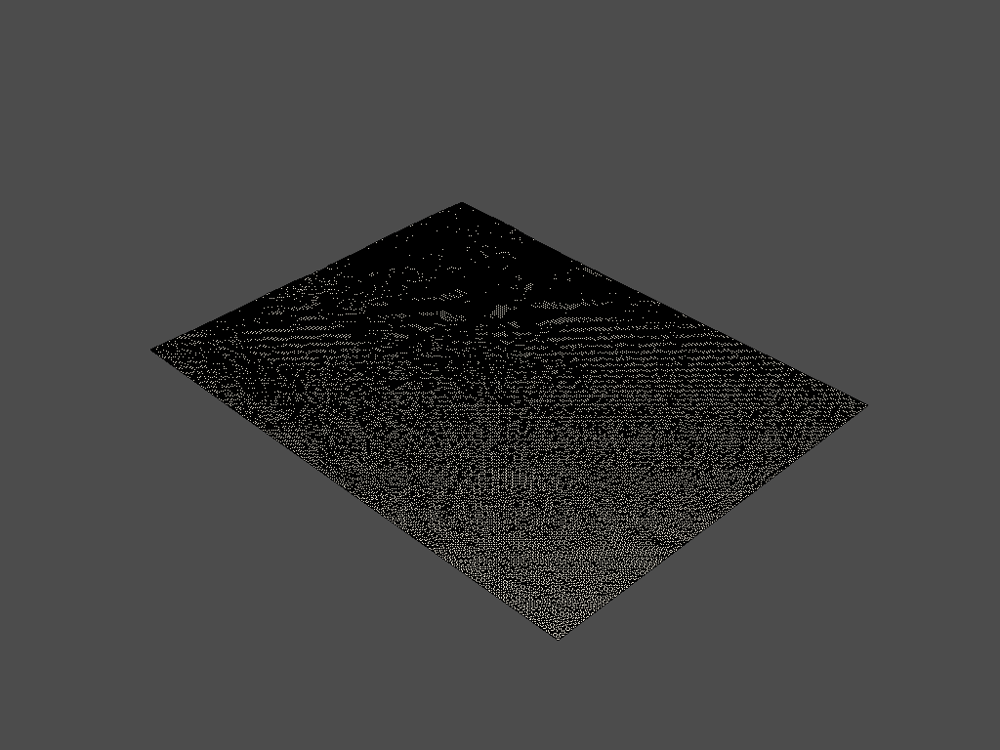

ERROR:root:The interactor must be set prior to enabling/disabling widget


In [14]:
from numpy import genfromtxt
import pyvista as pv
my_data = genfromtxt('arhchivoSalida.csv', delimiter=',',skip_header =1)
#x,y,z=my_data[:,0], my_data[:,1], my_data[:,2]
puntos = pv.PolyData(my_data)
superficie = puntos.delaunay_2d()
superficie.plot(show_edges=True)
superficie.save('SanRafael.vtk')

In [16]:
view(geometries={'San Rafael':superficie})

Viewer(geometries=[{'vtkClass': 'vtkPolyData', 'points': {'vtkClass': 'vtkPoints', 'name': '_points', 'numberO…

***

## Crear malla polydata 

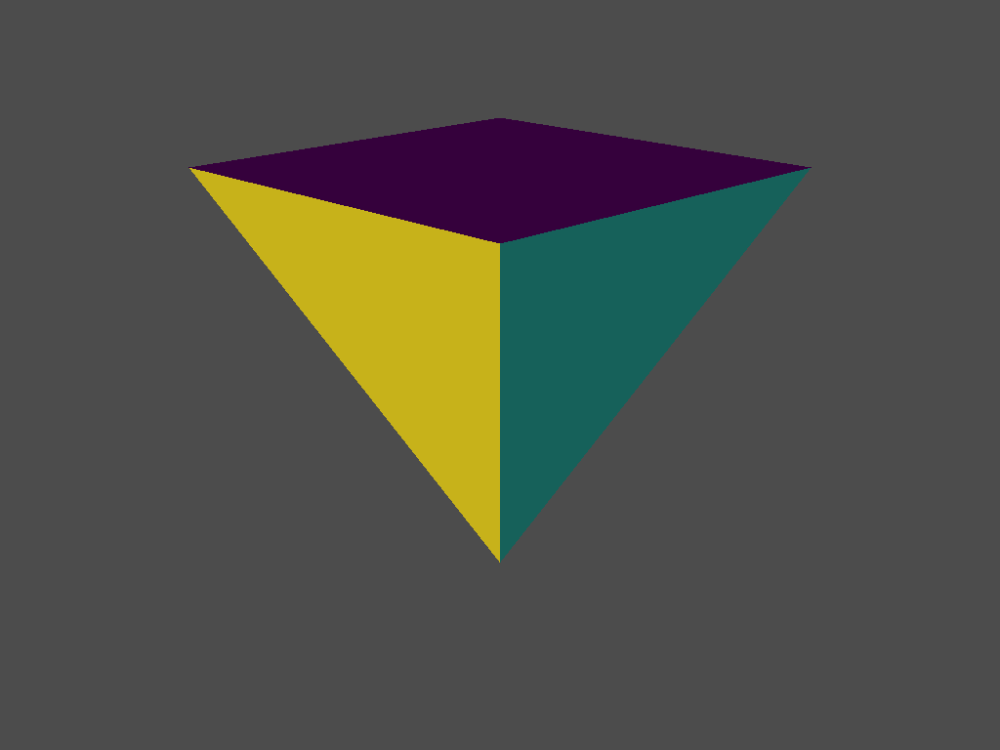

In [6]:
import pyvista as pv
from itkwidgets import view
import numpy as np
vertices = np.array([[0, 0, 0],
                     [1, 0, 0],
                     [1, 1, 0],
                     [0, 1, 0],
                     [0.5, 0.5, -1]])

faces = np.hstack([[4, 0, 1, 2, 3],  # square
                   [3, 0, 1, 4],     # triangle
                   [3, 1, 2, 4]])    # triangle


surf = pv.PolyData(vertices, faces)
# plot each face with a different color
surf.plot(scalars=np.arange(3), cpos=[-1, 1, 0.5])
surf.save("ejemplo_mesh.vtk")


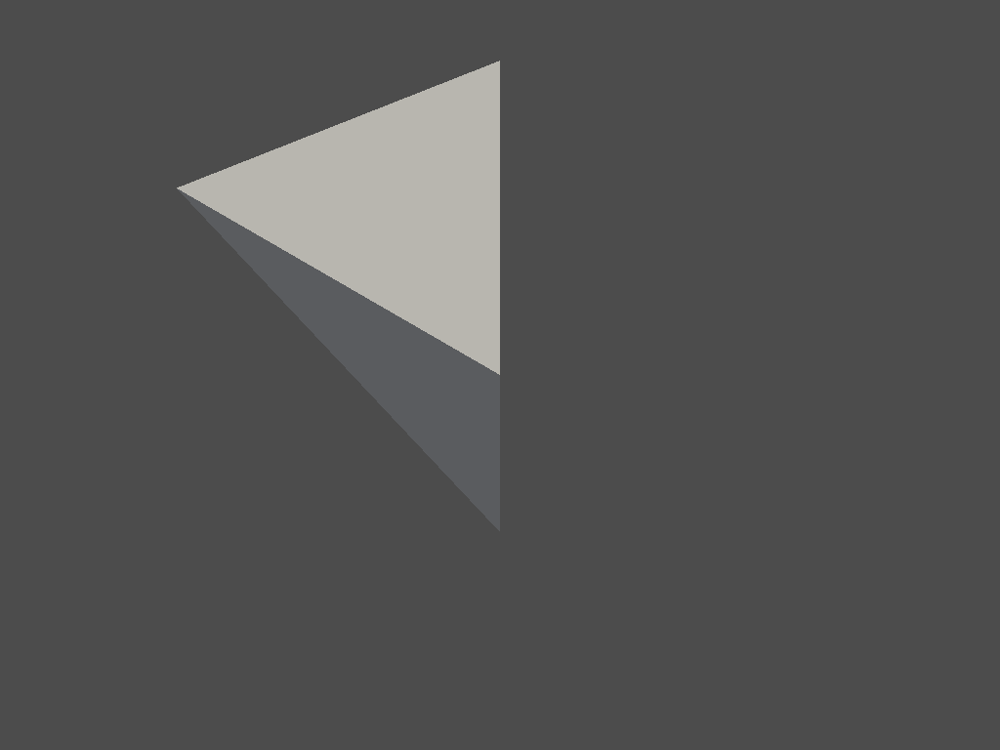

In [10]:
import pyvista as pv
from itkwidgets import view
import numpy as np
%matplotlib widget
vertices = np.array([[0, 0, 0],
                     [1, 0, 0],
                     [1, 1, 0],
                     [0, 1, 0],
                     [0.5, 0.5, -1]])

faces = np.hstack([[ 0, 1, 2],  
                   [3, 0, 1, 4],     # triangle
                   [3, 1, 2, 4]])    # triangle


surf = pv.PolyData(vertices, faces)
# plot each face with a different color
surf.plot()


***
## Otros ejemplos

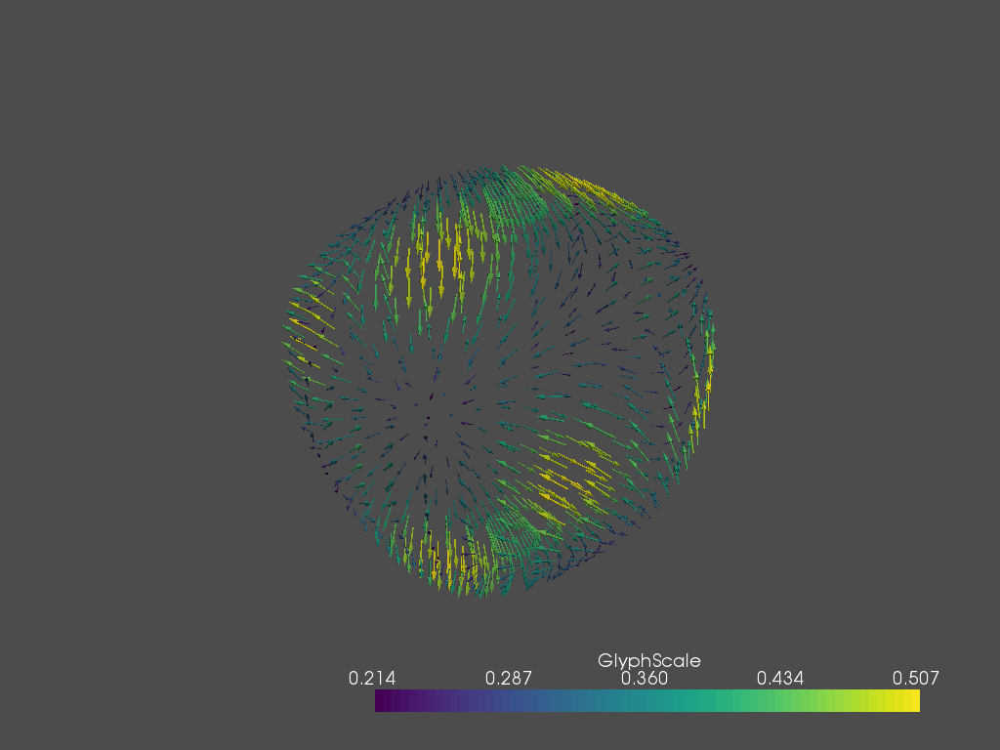

ERROR:root:The interactor must be set prior to enabling/disabling widget


In [14]:
import numpy as np
sphere = pv.Sphere(radius=3.14)

# make cool swirly pattern
vectors = np.vstack(
    (
        np.sin(sphere.points[:, 0]),
        np.cos(sphere.points[:, 1]),
        np.cos(sphere.points[:, 2]),
    )
).T

# add and scale
sphere.vectors = vectors * 0.3

# plot just the arrows
sphere.arrows.plot(scalars='GlyphScale')

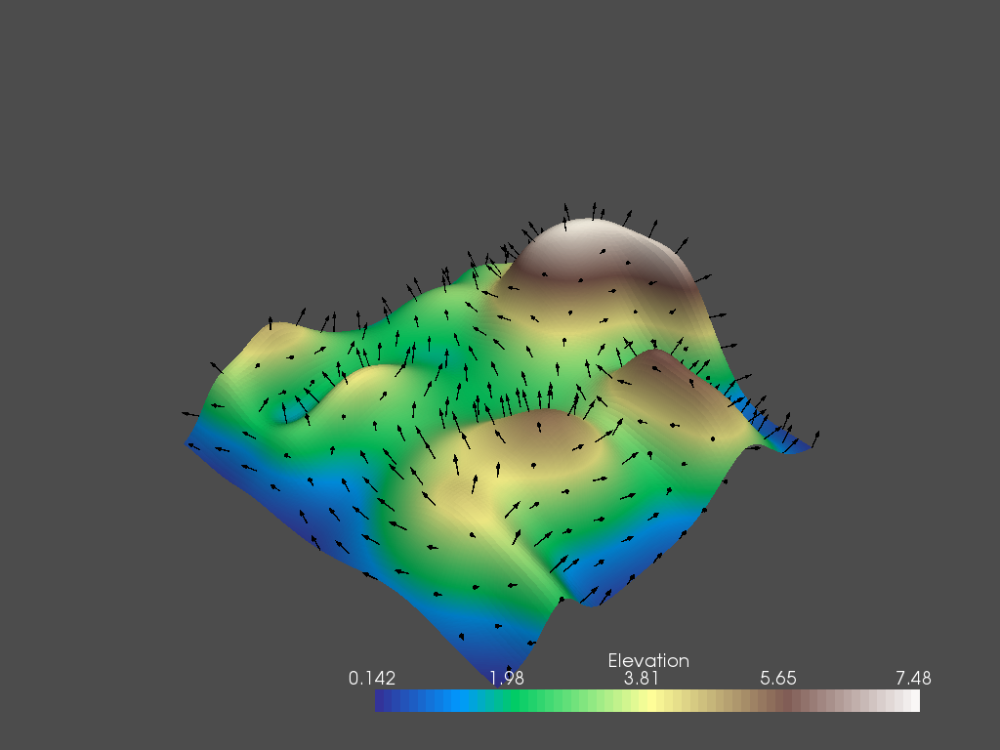

In [32]:
from pyvista import examples
import pyvista as pv
mesh = examples.load_random_hills()

# create a subset of arrows using the glyph filter
arrows = mesh.glyph(scale="Normals", orient="Normals", tolerance=0.05)

p = pv.Plotter()
p.add_mesh(arrows, color="black")
p.add_mesh(mesh, scalars="Elevation", cmap="terrain")
p.show()

In [17]:
from pyvista import examples
mesh = examples.download_st_helens().warp_by_scalar()
mesh

StructuredGrid (0x7fd5a95b8210)
  N Cells:	151916
  N Points:	152709
  X Bounds:	5.579e+05, 5.677e+05
  Y Bounds:	5.108e+06, 5.122e+06
  Z Bounds:	1.364e+03, 3.225e+03
  Dimensions:	327, 467, 1
  N Arrays:	1

In [18]:
from itkwidgets import view
view(geometries=mesh)

Viewer(geometries=[{'vtkClass': 'vtkPolyData', 'points': {'vtkClass': 'vtkPoints', 'name': '_points', 'numberO…